# Final Project
Friday May 17th, 2019 at 23:59

In [268]:
# Imports
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

import folium
from folium import plugins
from IPython.display import Image

#conda install -c conda-forge wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import json

### Motivation
- What is your dataset?
- Why did you choose this/these particular dataset(s)?
- What was your goal for the end user's experience?

For this project we have chosen a dataset on renting apartments using Airbnb in Copenhagen. The full Airbnb dataset is 1,9 GB, 494.954 rows and 90 variables, but after cleaning the dataset and cutting it down to only deal with Copenhagen it is 67 MB, 13103 rows and 90 variables. In addition, we also have a small dataset (79 KB) on property prices in Copenhagen for comparison.

According to [VisitDenmark](https://www.visitdenmark.dk/sites/default/files/VDK_Website_images/Corporate/Analyser/turismen_i_danmark.pdf) is Denmark the largest tourist nation in the Nordic countries with a tourism turnover of DKK 108.1 billion and with 12.5 million tourists overnight in Copenhagen every year. But Copenhagen is not known as cheap city to live in and especially some areas can be quite expensive. With data about Airbnb's entry into Copenhagen, it is possible for us to provide an overview for the tourists about the possibilities of staying overnight in Copenhagen. For example, we will be able to investigate questions like:

- How the city’s different neighborhoods differ when renting an Airbnb residence?
- Is there a pattern between prices, location and rating?
- Where is the most popular airbnbs?
- Where can you fint the airbnb with the highest rating and best price ratio?
- Is there correlation in price between real estate in Copenhagen and airbnb residences from the same area?

### Helping methods used thoughout the assignment

In [2]:
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

In [3]:
# Returns a subset of the data depending on given dates at cateories (type of crime)
def getSubSet(dates, crimes, data):
    subset = []
    for date in dates:
        subset.append(data.loc[data['Date'].str.contains(date)])
    subset = pd.concat(subset)
    result = []
    for crime in crimes:
        result.append(subset.loc[subset['Category'].str.contains(crime)])
    return pd.concat(result)

In [4]:
def df_to_geojson(df, properties, lat='Latitude', lon='Longitude'):
    geojson = {'type':'FeatureCollection', 'features':[], 'totalFeatures':len(df), 'crs':{'type':'airbnb','properties':{'name':"urn:ogc:def:crs:EPSG::4326"}}}
    for _, row in df.iterrows():
        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]}}
        feature['geometry']['coordinates'] = [float(row[lon]),float(row[lat])]
        for prop in properties:
            feature[prop] = row[prop]
            feature[prop]['District'] = str.encode(str(row[prop]['District'])).decode('utf8')
        geojson['features'].append(feature)
    
    return geojson

## Import Data

To import the full dataset one can use the following code snippet, though this is uncommented, since we only use the data dealing with Copenhagen

In [5]:
# Import full dataset data
#data1 = pd.read_csv("../../airbnb-listings.csv", sep=';')
#print(len(data1))
#dkset = data.loc[data['Country'].str.contains("Denmark", na=False)]
#dkset.to_csv("airbnbDK", sep='\t')

In [168]:
# Import Copenhagen dataset data
data = pd.read_csv('airbnbDK', sep='\t') 

# Import salgs times in copenhagen
dataSalgstider = pd.read_excel('Salgstider.xlsx') 

# Import house prices in Copenhagen
dataEjendomspriser = pd.read_excel('Ejendomspriser.xlsx')


In [7]:
# DAta clean up - Remove Nan
dataNotNan = data.dropna(subset=['Price', 'First Review', 'Last Review', 'Latitude', 'Longitude', 'Neighbourhood', 'Host Since',
                                 'Review Scores Rating', 'Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location',  'Review Scores Value' ])
dataNotNan.reset_index()
print("Data before clean", len(data), "\nData after clean", len(dataNotNan))


Data before clean 20548 
Data after clean 9509


In [177]:
before = len(dataEjendomspriser)
for key in dataEjendomspriser.keys()[2:-3]:
    dataEjendomspriser = dataEjendomspriser[pd.to_numeric(dataEjendomspriser[key], errors='coerce').notnull()] 
    

print("Data before clean", before, "\nData after clean", len(dataEjendomspriser))

Data before clean 258 
Data after clean 168


In [176]:
# Data snippet
data.head(5)

Index(['2009K1', '2009K2', '2009K3', '2009K4', '2010K1', '2010K2', '2010K3',
       '2010K4', '2011K1', '2011K2', '2011K3', '2011K4', '2012K1', '2012K2',
       '2012K3', '2012K4', '2013K1', '2013K2', '2013K3', '2013K4', '2014K1',
       '2014K2', '2014K3', '2014K4', '2015K1', '2015K2', '2015K3', '2015K4',
       '2016K1', '2016K2', '2016K3', '2016K4', '2017K1', '2017K2', '2017K3',
       '2017K4', '2018K1', '2018K2', '2018K3', '2018K4'],
      dtype='object')

In [9]:
# Dataset attributes
temp = [print(i,"-",data.keys()[i]) for i in range(len(data.keys()))]

0 - Unnamed: 0
1 - ID
2 - Listing Url
3 - Scrape ID
4 - Last Scraped
5 - Name
6 - Summary
7 - Space
8 - Description
9 - Experiences Offered
10 - Neighborhood Overview
11 - Notes
12 - Transit
13 - Access
14 - Interaction
15 - House Rules
16 - Thumbnail Url
17 - Medium Url
18 - Picture Url
19 - XL Picture Url
20 - Host ID
21 - Host URL
22 - Host Name
23 - Host Since
24 - Host Location
25 - Host About
26 - Host Response Time
27 - Host Response Rate
28 - Host Acceptance Rate
29 - Host Thumbnail Url
30 - Host Picture Url
31 - Host Neighbourhood
32 - Host Listings Count
33 - Host Total Listings Count
34 - Host Verifications
35 - Street
36 - Neighbourhood
37 - Neighbourhood Cleansed
38 - Neighbourhood Group Cleansed
39 - City
40 - State
41 - Zipcode
42 - Market
43 - Smart Location
44 - Country Code
45 - Country
46 - Latitude
47 - Longitude
48 - Property Type
49 - Room Type
50 - Accommodates
51 - Bathrooms
52 - Bedrooms
53 - Beds
54 - Bed Type
55 - Amenities
56 - Square Feet
57 - Price
58 - We

## Mappings to districts

In [10]:
# All Neighborhoods
#set(data['Neighbourhood'].values)

# mapping:
cityAreas = {
    'Amager Vest': 'Amager Vest', 
    'Amagerbro':'Amager Øst',
    'Amager Øst':'Amager Øst',
    'Brønshøj':'Brønshøj-Husum ',
    'Christianshavn':'Christianshavn',
    'Frederiksberg':'Frederiksberg',
    'Holmen':'Indre By',
    'Indre By':'Indre By',
    'Islands Brygge':'Amager Vest',
    'København NV':'Bispebjerg',
    'Kødbyen':'Vesterbro',
    'Nyboder':'Østerbro',
    'Nørrebro':'Nørrebro',
    'Sluseholmen':'Kongens Enghave',
    'Teglholmen':'Kongens Enghave',
    'Valby':'Valby',
    'Vanløse':'Vanløse',
    'Vesterbro':'Vesterbro',
    'Østerbro':'Østerbro',
    'Kastrup':'Amager Vest'
}

In [91]:
# All Zipcodes
# set(dataPrice['Postnummer'].values)
# set(dataNotNan['Zipcode'].values)

# mapping:
zipcodeToCityArea = {
    #range(1000, 1500) : 'Indre By', # og Christianshavn
    #range(1500, 1800) : 'Vesterbro',
    #range(1800, 2001) : 'Frederiksberg',
    #range(2100, 2200) : 'Østerbro',
    2200 : 'Nørrebro',
    2300 : 'Amager', # Amager øst og vest
    2400 : 'Bispebjerg',
    2450 : 'Kongens Enghave',
    2500 : 'Valby',
    2700 : 'Brønshøj-Husum ',
    2720 : 'Vanløse'
}

zipcodeToCityArea.update(
    dict(zip(range(1000,1500), ['Indre By' for i in range(1000,1500)])))
zipcodeToCityArea.update(
    dict(zip(range(1500,1800), ['Vesterbro' for i in range(1500,1800)])))
zipcodeToCityArea.update(
    dict(zip(range(1800,2001), ['Frederiksberg' for i in range(1800,2001)])))
zipcodeToCityArea.update(
    dict(zip(range(2100,2200), ['Østerbro' for i in range(2100,2200)])))
zipcodeToCityArea.update(
    dict(zip(range(2600,2700), ['Andet' for i in range(2600,2700)])))
zipcodeToCityArea.update(
    dict(zip(range(2730,2901), ['Andet' for i in range(2730,2901)])))




## Adding new Attributes to the dataset

In [13]:
# Round price to nearest 200
dataNotNan.loc[:,'Price to nearest 200'] = [p-p%200 if p%200 < 100 else p+(200-p%200) for p in dataNotNan['Price'].copy().values]
dataNotNan.groupby(['Price to nearest 200']).count()['ID']

Price to nearest 200
0.0          3
200.0      732
400.0     2801
600.0     2797
800.0     2318
1000.0     858
Name: ID, dtype: int64

In [14]:
# Find District
dataNotNan.loc[:,'District'] = [cityAreas[n] for n in dataNotNan['Neighbourhood'].values]
set(dataNotNan['District'])

{'Amager Vest',
 'Amager Øst',
 'Bispebjerg',
 'Brønshøj-Husum ',
 'Christianshavn',
 'Frederiksberg',
 'Indre By',
 'Kongens Enghave',
 'Nørrebro',
 'Valby',
 'Vanløse',
 'Vesterbro',
 'Østerbro'}

In [15]:
dataNotNan.loc[:,'First Review Month'] = [fr[:7] for fr in dataNotNan['First Review'].values]
dataNotNan.loc[:,'Last Review Month'] = [lr[:7] for lr in dataNotNan['Last Review'].values]


In [17]:
dataNotNan.loc[:,'Host Since Month'] = [hs[:7] if not isfloat(hs) else hs for hs in dataNotNan['Host Since'].values ]


In [18]:
# Dataset attributes
temp = [print(i,"-",dataNotNan.keys()[i]) for i in range(len(dataNotNan.keys()))]

0 - Unnamed: 0
1 - ID
2 - Listing Url
3 - Scrape ID
4 - Last Scraped
5 - Name
6 - Summary
7 - Space
8 - Description
9 - Experiences Offered
10 - Neighborhood Overview
11 - Notes
12 - Transit
13 - Access
14 - Interaction
15 - House Rules
16 - Thumbnail Url
17 - Medium Url
18 - Picture Url
19 - XL Picture Url
20 - Host ID
21 - Host URL
22 - Host Name
23 - Host Since
24 - Host Location
25 - Host About
26 - Host Response Time
27 - Host Response Rate
28 - Host Acceptance Rate
29 - Host Thumbnail Url
30 - Host Picture Url
31 - Host Neighbourhood
32 - Host Listings Count
33 - Host Total Listings Count
34 - Host Verifications
35 - Street
36 - Neighbourhood
37 - Neighbourhood Cleansed
38 - Neighbourhood Group Cleansed
39 - City
40 - State
41 - Zipcode
42 - Market
43 - Smart Location
44 - Country Code
45 - Country
46 - Latitude
47 - Longitude
48 - Property Type
49 - Room Type
50 - Accommodates
51 - Bathrooms
52 - Bedrooms
53 - Beds
54 - Bed Type
55 - Amenities
56 - Square Feet
57 - Price
58 - We

# Map of the data

In [19]:
def addCrimeLocations(m, fgv, color, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = color, 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [20]:
def addCrimeLocationsColors(m, fgv, colors, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = colors[int(bnb[90]/200)], 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [21]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")

m = addCrimeLocations(m, fgv, 'Red', dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locations.html")
m
#Image("locations.png")

In [22]:
# Colors
#'red', 'blue', 'green', 'purple', 'orange', 'darkred', 
#'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 
#'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 
#'gray', 'black', 'lightgray'

In [23]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")
colors = ['yellow','green','cadetblue','orange','red','purple']

m = addCrimeLocationsColors(m, fgv, colors, dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locationsPriceColors.html")
m
#Image("locations.png")

# Extract Data for Observable

#### District Attributes (Average price / Count)

In [183]:
# Find price per district
districtAirbnb = dataNotNan.groupby(['District'])['Price'].sum().reset_index()

# Find number of airbnb per district
countAirbnbDistrict = dataNotNan.groupby('District').count()['ID']

In [264]:
dataEjendomspriser.loc[:,'District'] = [zipcodeToCityArea[z] for z in dataEjendomspriser['Postnummer'].values]
districtEjendom = dataEjendomspriser.groupby(['District'])['2018K4'].sum().reset_index()

amager = districtEjendom.loc[districtEjendom['District']=='Amager']['2018K4'].values[0]
indreBy = districtEjendom.loc[districtEjendom['District']=='Indre By']['2018K4'].values[0]
districtEjendom = districtEjendom.append({'District':'Amager Vest', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Amager Øst', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Christianshavn', '2018K4':indreBy}, ignore_index=True)


In [265]:
countEjendomDistrict = dataEjendomspriser.groupby('District').count()
countEjendomDistrict = countEjendomDistrict['Navn'].reset_index()

amager = countEjendomDistrict.loc[countEjendomDistrict['District']=='Amager']['Navn'].values[0]
indreBy = countEjendomDistrict.loc[countEjendomDistrict['District']=='Indre By']['Navn'].values[0]

countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Vest', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Øst', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Christianshavn', 'Navn':indreBy}, ignore_index=True)


In [267]:
# combine data
districtAirbnb['District'] = [str.encode(str(d)).decode('utf8') for d in districtAirbnb['District'].values]
districtAirbnb['Count'] = [countAirbnbDistrict[d] for d in districtAirbnb['District'].values]
districtAirbnb['Average price'] = districtAirbnb['Price']/districtAirbnb['Count']
districtAirbnb['Average house price'] = [(districtEjendom.loc[districtEjendom['District']==d]['2018K4'].values[0]
                                        /countEjendomDistrict.loc[countEjendomDistrict['District']==d]['Navn'].values[0])
                                        for d in districtAirbnb['District'].values]
districtAirbnb


,District,Price,Count,Average price,Average house price
0,Amager Vest,445734.0,737,604.795115,39639.500000
1,Amager Øst,378613.0,669,565.938714,39639.500000
2,Bispebjerg,265545.0,553,480.189873,33671.666667
3,Brønshøj-Husum,75293.0,152,495.348684,31547.166667
4,Christianshavn,143040.0,208,687.692308,50634.000000
5,Frederiksberg,719984.0,1150,626.073043,45733.000000
6,Indre By,540470.0,767,704.654498,50634.000000
7,Kongens Enghave,35501.0,58,612.086207,40487.333333
8,Nørrebro,1259272.0,2159,583.266327,42867.333333
9,Valby,194147.0,376,516.348404,36170.666667


In [25]:
output_filename = 'airBnbDistrictData.json'
sumPriceDistrict.set_index('District').to_json(output_filename)

#### airbnb places as geojson (indivitual locations)

In [26]:
# Find airbnb places with properties
airbnbPlaces = dataNotNan.filter(['Latitude','Longitude'], axis=1)
#airbnbPlaces.to_csv("locationAndPrice.csv")
print(len(airbnbPlaces))

airbnbPlaces['properties'] = [row.to_dict() for idx, row in dataNotNan.filter(['Price to nearest 200','District'], axis=1).iterrows()]
airbnbPlaces.head(5)


9509


,Latitude,Longitude,properties
0,55.695206,12.511293108812785,"{'Price to nearest 200': 600.0, 'District': 'V..."
2,55.695235,12.507283859127154,"{'Price to nearest 200': 600.0, 'District': 'V..."
3,55.664765,12.614418747491374,"{'Price to nearest 200': 600.0, 'District': 'A..."
6,55.656692,12.609505449062533,"{'Price to nearest 200': 600.0, 'District': 'A..."
12,55.701262,12.474425857466034,"{'Price to nearest 200': 600.0, 'District': 'B..."


In [27]:
geojson = df_to_geojson(airbnbPlaces, ['properties']) 

output_filename = 'dataset.json'
with open(output_filename, 'w') as output_file:
    #output_file.write('var dataset = ')
    json.dump(geojson, output_file, indent=2, ensure_ascii=False)

In [28]:
# Load data again
#with open(output_filename) as json_file:  
#    data = json.load(json_file)
#data

# Statistics

### Basic stats. Let's understand the dataset better

Firstly, the full Airbnb-dataset of 1.9 GB is being cut down to only deal with Copenhagen and not all capitals in the world. 

Write about your choices in data cleaning and preprocessing
Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

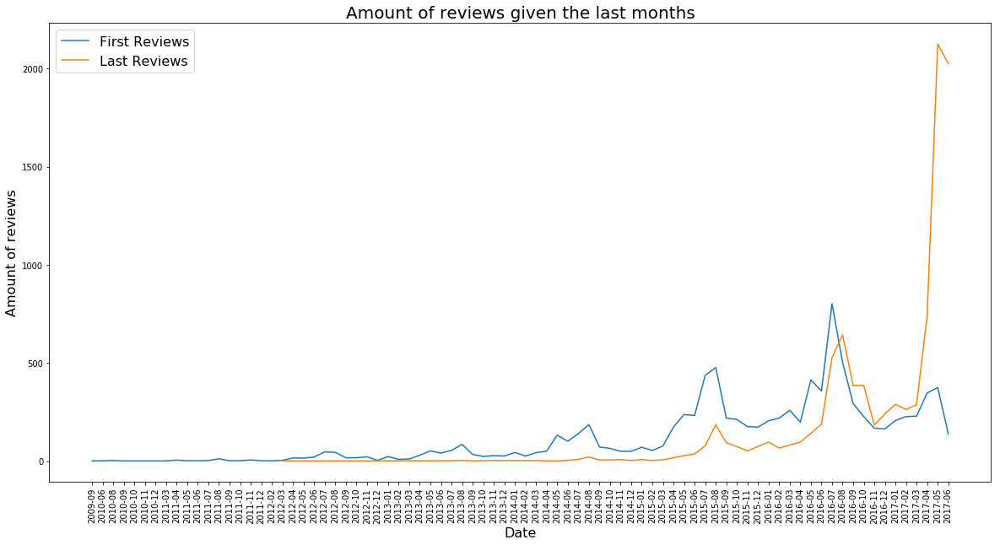

In [29]:
firstReviewData = dataNotNan.groupby('First Review Month').count()['ID']
lastReviewData = dataNotNan.groupby('Last Review Month').count()['ID']

plt.figure(figsize=(20,10))

plt.plot(firstReviewData.keys(), firstReviewData.values)

plt.plot(lastReviewData.keys(), lastReviewData.values)

plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['First Reviews','Last Reviews'], fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Amount of reviews', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.savefig("reviews.png")
plt.show()

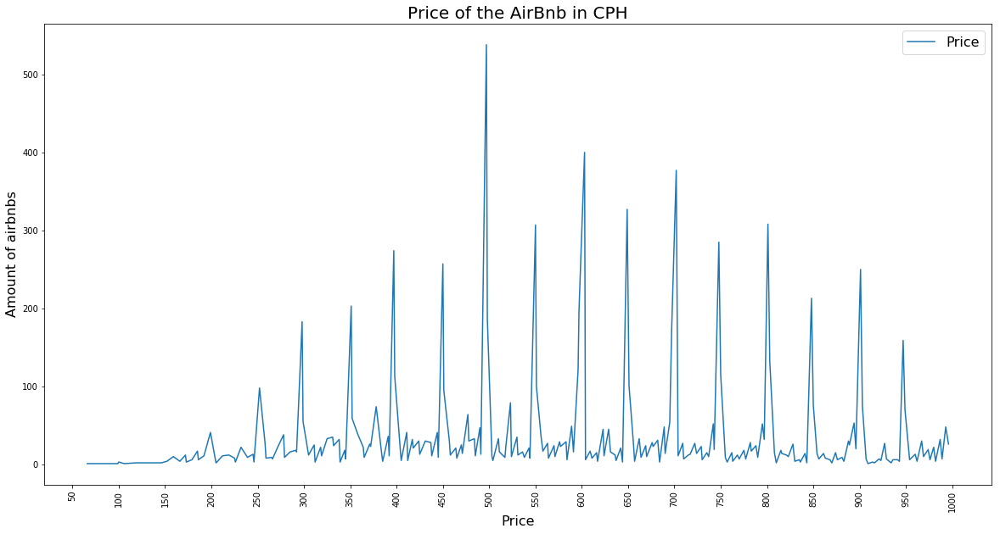

In [30]:
plt.figure(figsize=(20,10))
dataP = dataNotNan.groupby('Price')['ID'].count()

minP = min(dataP.keys())-min(dataP.keys())%50
maxP = max(dataP.keys())+50

plt.plot(dataP.keys(), dataP.values)

plt.xticks(np.arange(minP, maxP, 50.0), rotation='vertical')
plt.legend(['Price'], fontsize=16)
plt.xlabel('Price', fontsize=16)
plt.ylabel('Amount of airbnbs', fontsize=16)
plt.title('Price of the AirBnb in CPH', fontsize=20)
plt.savefig('pris.png')
plt.show()

In [31]:
rsr = dataNotNan.groupby('Review Scores Rating').count()['ID']
rsa = dataNotNan.groupby('Review Scores Accuracy').count()['ID']
rscl = dataNotNan.groupby('Review Scores Cleanliness').count()['ID']
rsch = dataNotNan.groupby('Review Scores Checkin').count()['ID']
rsco = dataNotNan.groupby('Review Scores Communication').count()['ID']
rsl = dataNotNan.groupby('Review Scores Location').count()['ID']
rsv = dataNotNan.groupby('Review Scores Value').count()['ID']

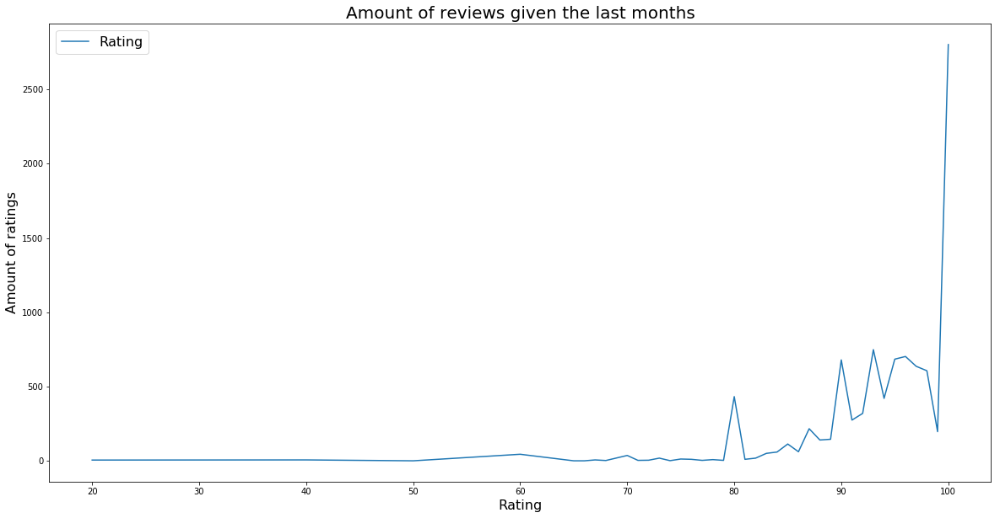

In [32]:
plt.figure(figsize=(20,10))
plt.plot(rsr.keys(), rsr.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Rating'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

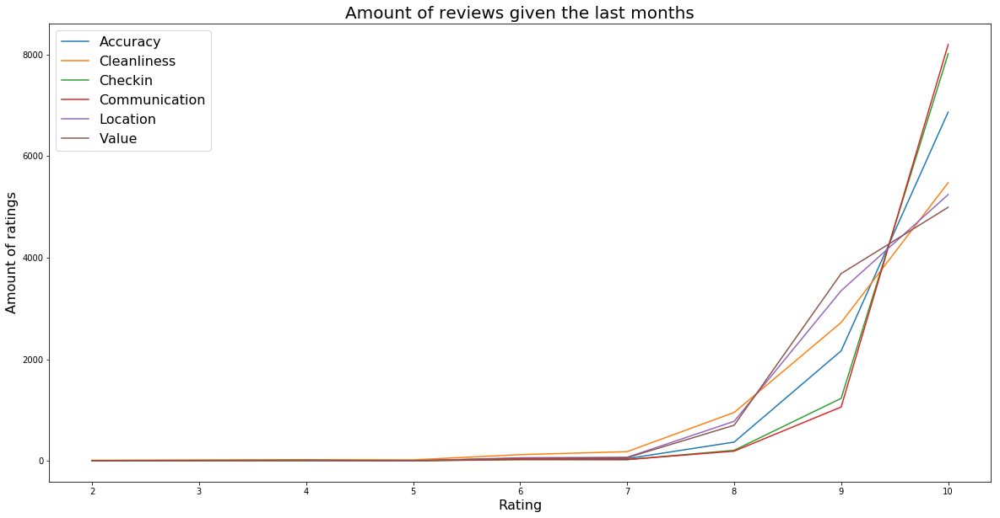

In [33]:
plt.figure(figsize=(20,10))

#plt.plot(rsr.keys(), rsr.values)
plt.plot(rsa.keys(), rsa.values)
plt.plot(rscl.keys(), rscl.values)
plt.plot(rsch.keys(), rsch.values)
plt.plot(rsco.keys(), rsco.values)
plt.plot(rsl.keys(), rsl.values)
plt.plot(rsv.keys(), rsv.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

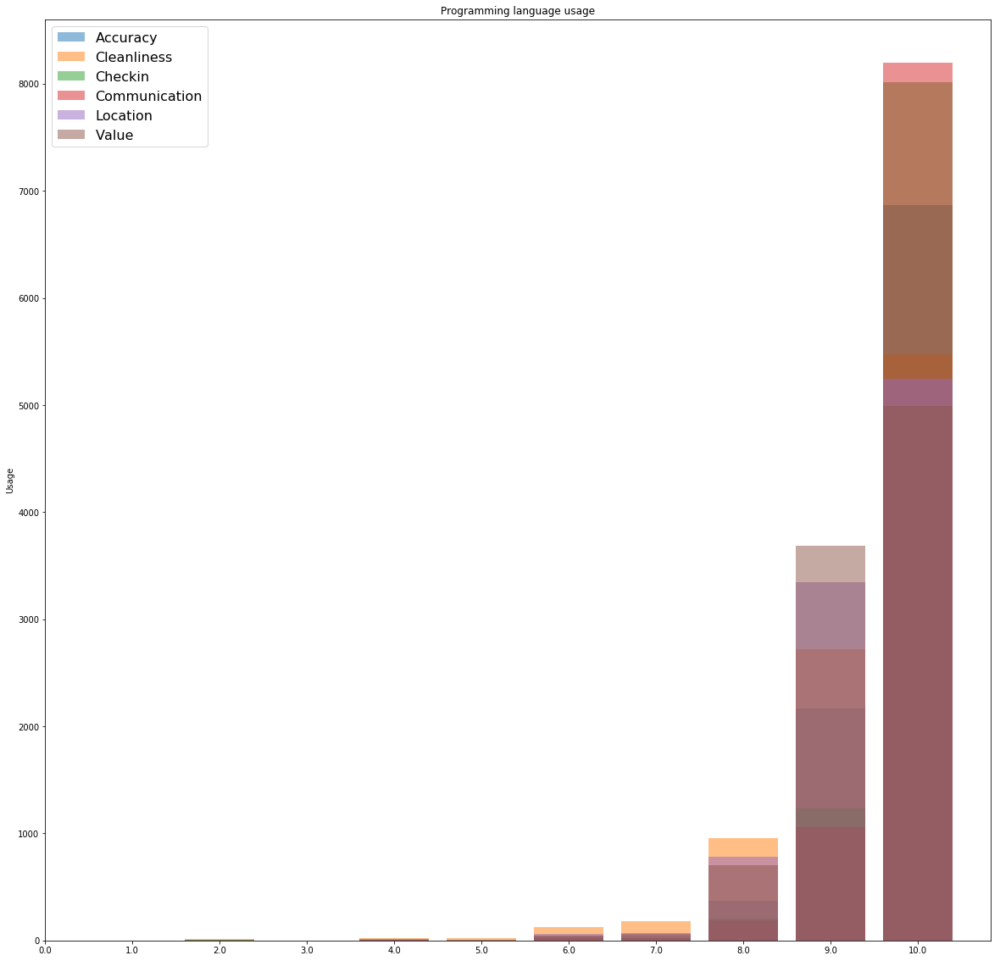

In [34]:
plt.figure(figsize=(20,20))
objects = np.arange(11.0)
y_pos = np.arange(11.0)
performance = rsr.values
    
plt.bar(rsa.keys(), rsa.values, align='center', alpha=0.5)
plt.bar(rscl.keys(), rscl.values, align='center', alpha=0.5)
plt.bar(rsch.keys(), rsch.values, align='center', alpha=0.5)
plt.bar(rsco.keys(), rsco.values, align='center', alpha=0.5)
plt.bar(rsl.keys(), rsl.values, align='center', alpha=0.5)
plt.bar(rsv.keys(), rsv.values, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.ylabel('Usage')
plt.title('Programming language usage')
 
plt.show()

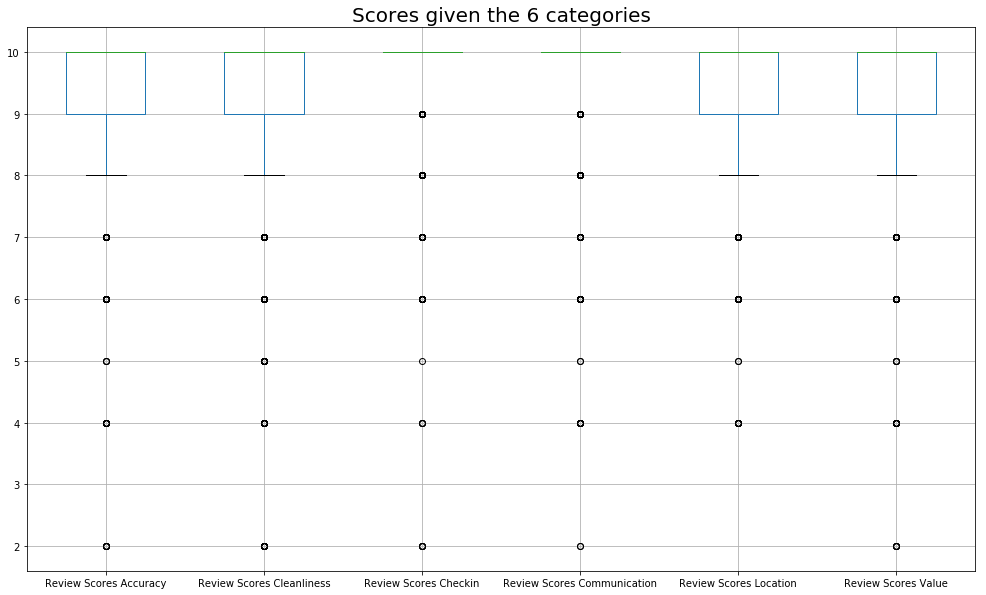

In [35]:
df = pd.DataFrame(data = dataNotNan, columns = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value'])

bp = df.boxplot(figsize=(17,10))
plt.title("Scores given the 6 categories", fontsize=20 )

plt.savefig("boxplot.png", format="png")
plt.show()

-  Review Scores Rating
-  Review Scores Accuracy
-  Review Scores Cleanliness
-  Review Scores Checkin
-  Review Scores Communication
-  Review Scores Location
-  Review Scores Value

In [36]:
ratings = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value']

lengthAnd = []
lengthOr = []

for score in range(1,11):
    testAnd = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           & (dataNotNan[ratings[1]] <= score)
           & (dataNotNan[ratings[2]] <= score)
           & (dataNotNan[ratings[3]] <= score)
           & (dataNotNan[ratings[4]] <= score)
           & (dataNotNan[ratings[5]] <= score)]

    testOr = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           | (dataNotNan[ratings[1]] <= score)
           | (dataNotNan[ratings[2]] <= score)
           | (dataNotNan[ratings[3]] <= score)
           | (dataNotNan[ratings[4]] <= score)
           | (dataNotNan[ratings[5]] <= score)]
    lengthOr.append(len(testOr))
    lengthAnd.append(len(testAnd))

(lengthOr, lengthAnd)

([0, 20, 20, 53, 80, 288, 569, 2238, 7020, 9509],
 [0, 0, 0, 2, 2, 4, 6, 46, 425, 9509])

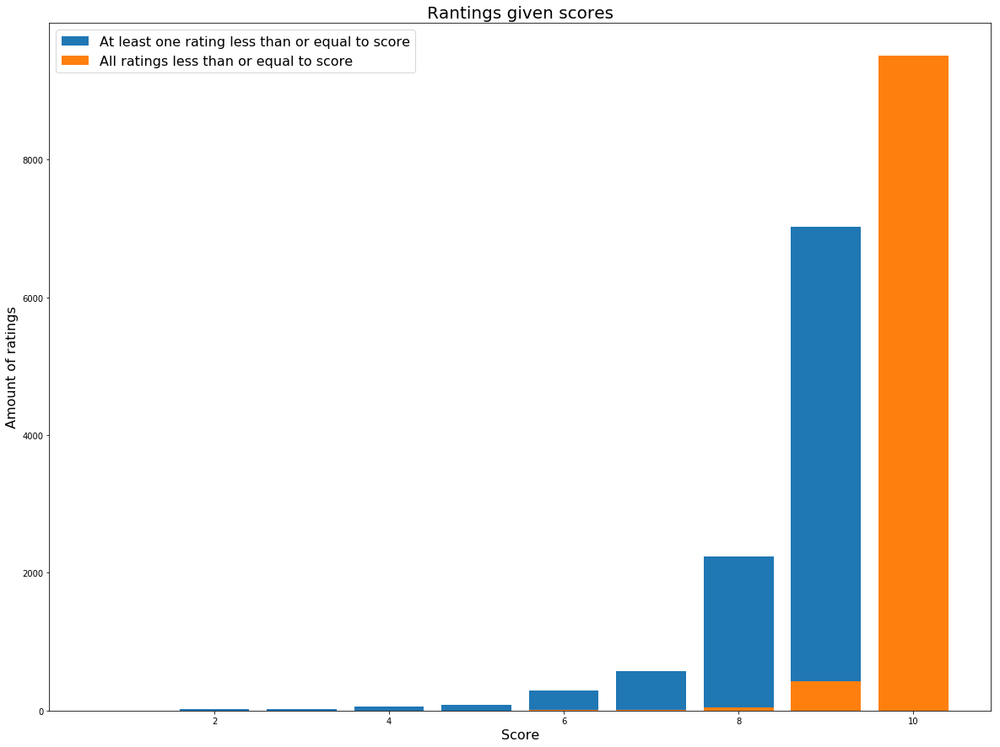

In [37]:
plt.figure(figsize=(20,15))

plt.bar(range(1,11),lengthOr)
plt.bar(range(1,11),lengthAnd)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['At least one rating less than or equal to score','All ratings less than or equal to score'], fontsize=16)
plt.xlabel('Score', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Rantings given scores', fontsize=20)
plt.show()

In [38]:
averageRatings = []
for r in ratings:
    averageRatings.append((r, sum(dataNotNan[r].values)/len(dataNotNan)))
    
averageRatings

[('Review Scores Accuracy', 9.648122831002208),
 ('Review Scores Cleanliness', 9.369229151330318),
 ('Review Scores Checkin', 9.8012409296456),
 ('Review Scores Communication', 9.820696182563887),
 ('Review Scores Location', 9.430329161846672),
 ('Review Scores Value', 9.411504890104112)]

In [39]:
a = dataNotNan.groupby(['Host Since Month','Number of Reviews'])
a.count()['ID']

Host Since Month  Number of Reviews
2009-03           7.0                   1
2009-04           3.0                   1
2009-05           12.0                  1
                  91.0                  1
2009-08           43.0                  1
2009-10           2.0                   1
                  27.0                  1
2009-12           10.0                  1
                  11.0                  1
                  38.0                  1
2010-01           12.0                  1
2010-02           4.0                   1
                  8.0                   1
                  40.0                  1
                  57.0                  1
2010-03           7.0                   1
                  12.0                  1
2010-04           1.0                   1
                  4.0                   1
                  10.0                  1
                  45.0                  1
                  143.0                 1
2010-05           1.0                   

In [40]:
a.count()['ID']

Host Since Month  Number of Reviews
2009-03           7.0                   1
2009-04           3.0                   1
2009-05           12.0                  1
                  91.0                  1
2009-08           43.0                  1
2009-10           2.0                   1
                  27.0                  1
2009-12           10.0                  1
                  11.0                  1
                  38.0                  1
2010-01           12.0                  1
2010-02           4.0                   1
                  8.0                   1
                  40.0                  1
                  57.0                  1
2010-03           7.0                   1
                  12.0                  1
2010-04           1.0                   1
                  4.0                   1
                  10.0                  1
                  45.0                  1
                  143.0                 1
2010-05           1.0                   

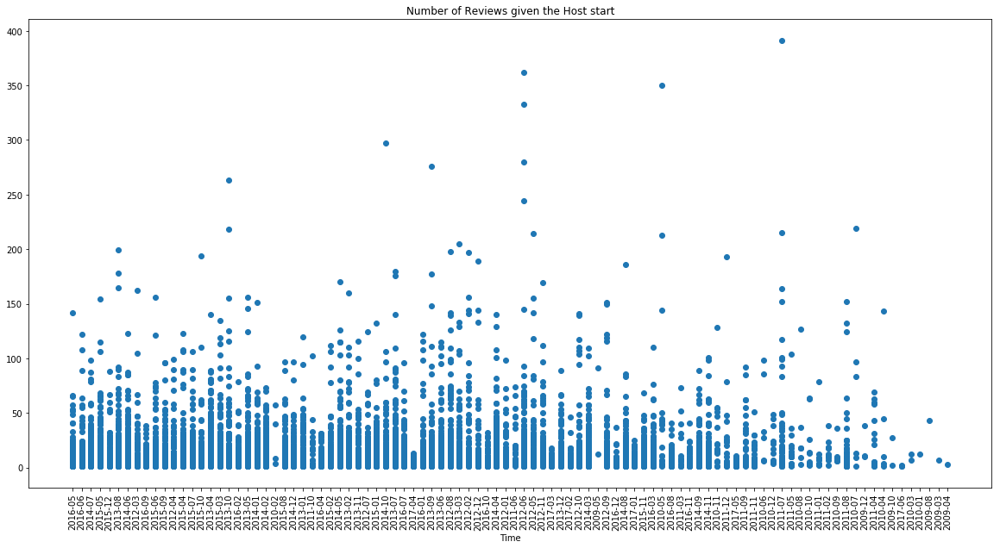

In [41]:

plt.figure(figsize=(20,10))
plt.plot(dataNotNan['Host Since Month'], dataNotNan['Number of Reviews'],'o')
plt.title("Number of Reviews given the Host start")
plt.xlabel('Time')
plt.xticks(rotation='vertical')
plt.show()

In [42]:
# all text
text = ' '.join([s for s in dataNotNan['Summary'].values if not isfloat(s)])
text

# text in holmen
subset = dataNotNan.loc[dataNotNan['Neighbourhood'] == 'Christianshavn']
text = ' '.join([s for s in subset['Summary'].values if not isfloat(s)])

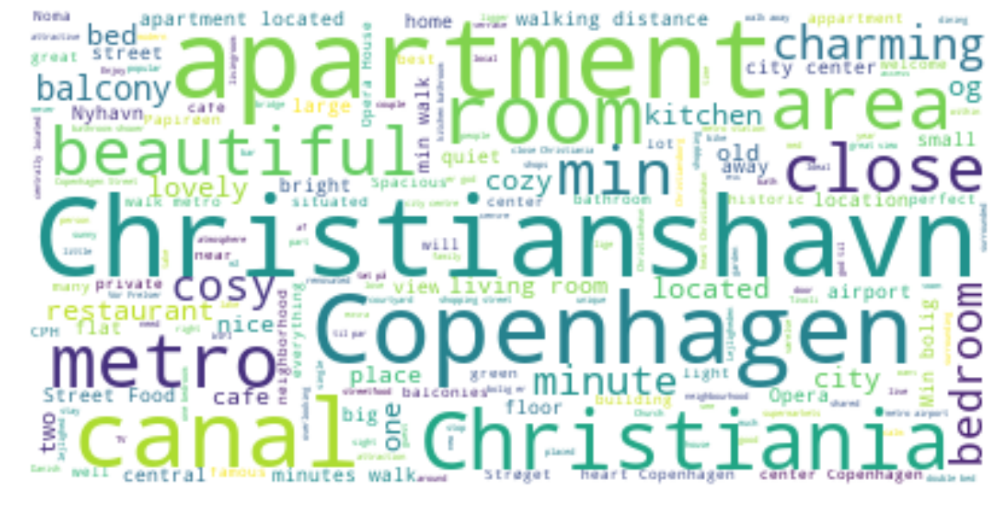

In [43]:

wordcloud = WordCloud(background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(20,20))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud.png')
plt.show()

# Ejendomspriser Data

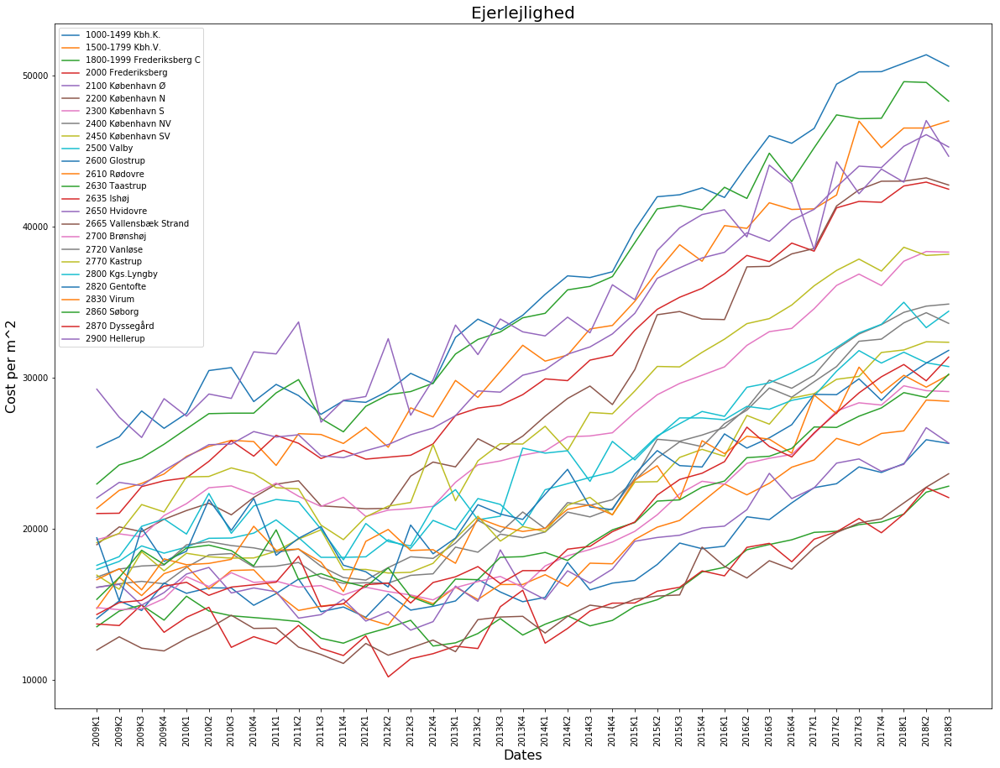

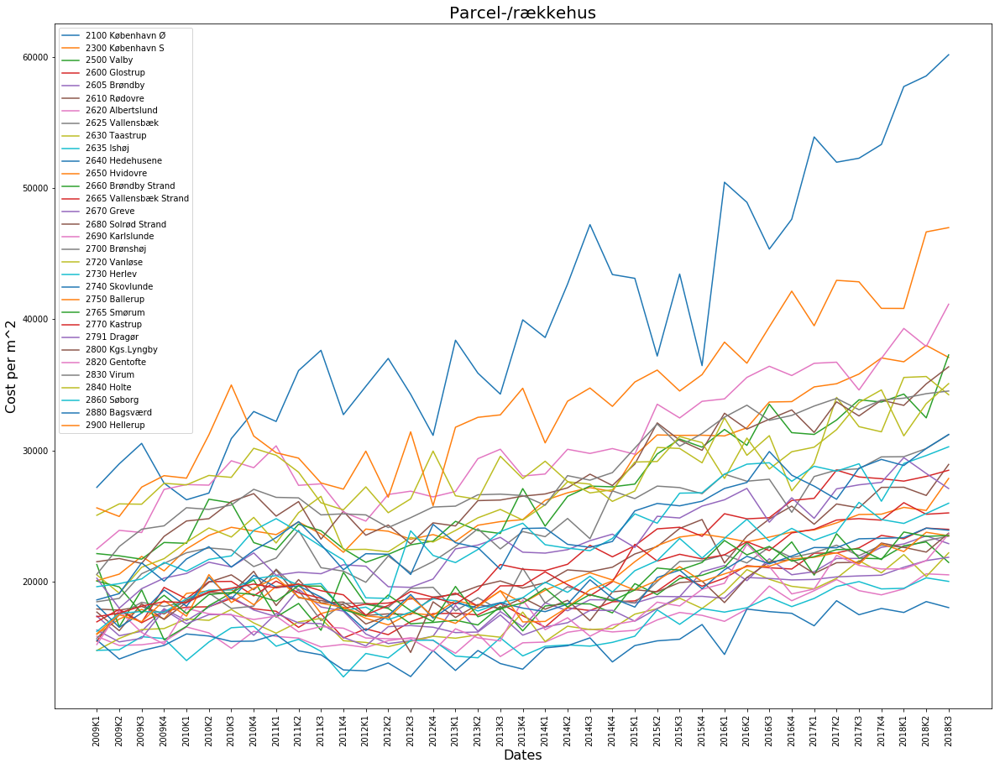

In [44]:
dataPrice = dataEjendomspriser.loc[dataEjendomspriser['Type Pris'].str.contains('Realiseret handelspris')]

for typeHouse in set(dataPrice['Type Hus']):
    subset = dataPrice.loc[dataPrice['Type Hus'].str.contains(typeHouse)]

    legends = []

    plt.figure(figsize=(20,15))
    for row in subset.values:
        temp = [r for r in row[2:41] if r != '..']
        if len(temp) == 39:
            plt.plot(temp)
            legends.append(row[1])

    plt.legend(legends)
    plt.title(typeHouse, fontsize=20)
    plt.xlabel('Dates', fontsize=16)
    plt.ylabel('Cost per m^2', fontsize=16)
    plt.xticks(range(39),subset.keys()[2:41], rotation='vertical')
    plt.show()